In [275]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json, ast
import plotly.figure_factory as ff
import geopandas as gpd
from colour import Color
import plotly.express as px 
import datetime as dt
import plotly.graph_objects as go
import calendar
import json
from urllib.request import urlopen
from plotly.subplots import make_subplots

In [2]:
engagements = pd.read_csv("Pandas_output2.csv")
districts = pd.read_csv("districts_info.csv")
products = pd.read_csv("products_info.csv")
engagements.dropna(subset=['lp_id'], inplace=True)
engagements['lp_id'] = engagements['lp_id'].astype('int')
engagements['district_id'] = engagements['filename'].str.split(".").str[0].astype('int')
engagements = pd.merge(pd.merge(engagements, districts, on="district_id"), products, left_on="lp_id", right_on='LP ID')
engagements = engagements[['time', 'pct_access','engagement_index','state',
         'locale','URL','Product Name','Provider/Company Name',
         'Primary Essential Function']]
engagements['time'] = pd.to_datetime(engagements['time'])
engagements = engagements.pivot_table(index='time',columns='Product Name',values='engagement_index', aggfunc=np.mean)

# Reading State wise Policy data 
plot_data = pd.read_csv("SchoolsClosedDates.csv", encoding='latin-1')
plot_data = plot_data[plot_data['date']!='0']

# Reading Google Mobility data
mobility = pd.read_csv("mobility_cleaned.csv")
mobility.rename(columns={"retail_and_recreation_percent_change_from_baseline": "Retail and Recreation", 
                     "grocery_and_pharmacy_percent_change_from_baseline": "Grocery and Pharmacy",
                    "parks_percent_change_from_baseline": "Parks", 
                     "workplaces_percent_change_from_baseline": "Workplaces",
                    "residential_percent_change_from_baseline": "Resedential",
                        "sub_region_1": "State"}, inplace=True)

engagements.to_csv('cleaned/cleaned_engagement_data.csv')
plot_data.to_csv('cleaned/cleaned_school_policy_data.csv')
mobility.to_csv('cleaned/cleaned_mobility_data.csv')
#return engagements, plot_data, mobility

FileNotFoundError: [Errno 2] No such file or directory: 'Pandas_output2.csv'

In [4]:
plot_data = pd.read_csv("MobilityRestrictedDates.csv", encoding='latin-1')
plot_data = plot_data[plot_data['MobilityRestrictedDate']!='0']
plot_data.to_csv('cleaned/cleaned_mobility_policy_data.csv')

In [17]:
apple_mobility=pd.read_csv('apple_mobility_report_US.csv')
apple_mobility = apple_mobility[apple_mobility.transit != 0]
apple_mobility["week"]=pd.to_datetime(apple_mobility["date"]).dt.week
apple_mobility["month"]=pd.to_datetime(apple_mobility["date"]).dt.month
apple_mobility["year"]=pd.to_datetime(apple_mobility["date"]).dt.year


apple_mobility2021 = apple_mobility[apple_mobility['year']==2021].dropna(subset=['month'])
apple_mobility2021 = apple_mobility2021.groupby(["state", 'month']).mean().reset_index()
apple_mobility2021 = pd.pivot_table(apple_mobility2021, values="transit", index=["state"], columns=["month"])

apple_mobility2020 = apple_mobility[apple_mobility['year']==2020]
apple_mobility2020 = apple_mobility2020.groupby(["state", 'month']).mean().reset_index()
apple_mobility2020 = pd.pivot_table(apple_mobility2020, values="transit", index=["state"], columns=["month"])

<ipython-input-17-66c5eb830f6d>:3: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



In [20]:
apple_mobility2020.to_csv('cleaned/cleaned_apple_mobility2020.csv')

In [5]:
apple_mobility2021.to_csv('cleaned/cleaned_apple_mobility2021.csv')

In [18]:
covid_state = pd.read_csv("https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-states.csv")

In [19]:
covid_state

,date,state,fips,cases,deaths
0,2020-01-21,Washington,53,1,0
1,2020-01-22,Washington,53,1,0
2,2020-01-23,Washington,53,1,0
3,2020-01-24,Illinois,17,1,0
4,2020-01-24,Washington,53,1,0
...,...,...,...,...,...
35169,2021-11-30,Virginia,51,969116,14710
35170,2021-11-30,Washington,53,776973,9349
35171,2021-11-30,West Virginia,54,294794,4868
35172,2021-11-30,Wisconsin,55,980861,10006


In [20]:
covid_state['cases_diff'] = covid_state.groupby(['state'])['cases'].diff()

In [21]:
covid_state.query('state == "Arizona"')

,date,state,fips,cases,deaths,cases_diff
8,2020-01-26,Arizona,4,1,0,NaN
12,2020-01-27,Arizona,4,1,0,0.0
16,2020-01-28,Arizona,4,1,0,0.0
20,2020-01-29,Arizona,4,1,0,0.0
24,2020-01-30,Arizona,4,1,0,0.0
...,...,...,...,...,...,...
34897,2021-11-26,Arizona,4,1258919,22177,3322.0
34953,2021-11-27,Arizona,4,1262574,22224,3655.0
35009,2021-11-28,Arizona,4,1264848,22229,2274.0
35065,2021-11-29,Arizona,4,1266809,22230,1961.0


In [60]:
vaccinations = pd.read_csv("/Users/Vineeth/Downloads/COVID-19_Vaccinations_in_the_United_States_Jurisdiction.csv")

In [61]:
vaccinations

,Date,MMWR_week,Location,Distributed,Distributed_Janssen,Distributed_Moderna,Distributed_Pfizer,Distributed_Unk_Manuf,Dist_Per_100K,Distributed_Per_100k_12Plus,...,Administered_Dose1_Recip_5PlusPop_Pct,Series_Complete_5Plus,Series_Complete_5PlusPop_Pct,Administered_5Plus,Admin_Per_100k_5Plus,Distributed_Per_100k_5Plus,Series_Complete_Moderna_5Plus,Series_Complete_Pfizer_5Plus,Series_Complete_Janssen_5Plus,Series_Complete_Unk_Manuf_5Plus
0,12/01/2021,48,NV,4775560,236000,1698160,2841400,0,155043,182148,...,70.8,1681069.0,58.1,3973678.0,137280.0,164983.0,573440.0,945973.0,161608.0,48.0
1,12/01/2021,48,DC,1466985,65700,544340,856945,0,207862,240586,...,87.4,456103.0,69.1,1167937.0,176858.0,222142.0,162739.0,256540.0,36498.0,326.0
2,12/01/2021,48,RP,34190,3800,23100,7290,0,158787,183374,...,89.3,15804.0,77.6,34214.0,167938.0,167820.0,11704.0,1761.0,2339.0,0.0
3,12/01/2021,48,MI,16563560,841200,6618420,9103940,0,165854,192712,...,65.0,5460127.0,58.0,12793223.0,135803.0,175826.0,2059545.0,3004881.0,394734.0,967.0
4,12/01/2021,48,HI,2820800,115900,1044580,1660320,0,199227,232910,...,87.3,863781.0,64.9,2083986.0,156614.0,211986.0,275950.0,514659.0,55038.0,18134.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22867,12/13/2020,51,AS,3900,0,0,0,0,7003,0,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
22868,12/13/2020,51,LTC,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
22869,12/13/2020,51,VI,975,0,0,0,0,931,0,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
22870,12/13/2020,51,US,13650,0,0,0,0,4,0,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN


In [62]:
vaccinations['vaccinations_diff'] = vaccinations.groupby(['Location'])['Distributed'].diff()

<AxesSubplot:xlabel='Date'>

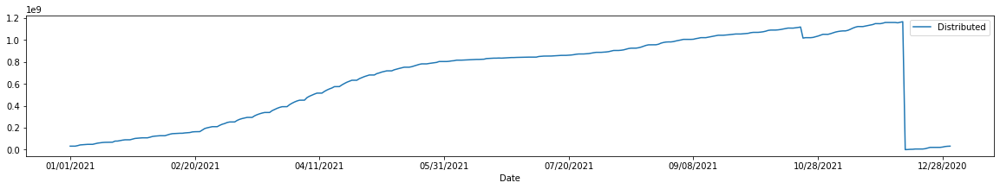

In [65]:
vaccinations.groupby('Date').sum().reset_index().plot(x='Date',y='Distributed')

<AxesSubplot:xlabel='date'>

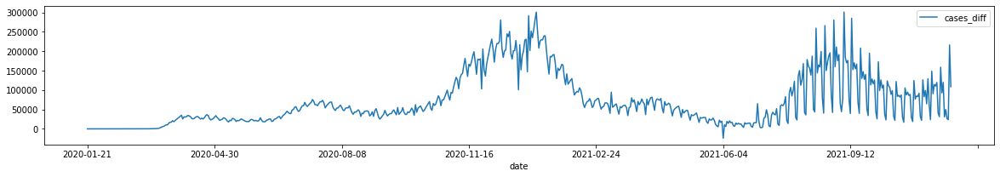

In [34]:
import matplotlib as plt
plt.rcParams["figure.figsize"] = (20,3)
covid_state.groupby('date').sum().reset_index().plot(x='date',y='cases_diff')

In [36]:
cases = pd.read_csv("https://drive.google.com/uc?id=1U8PnmBCV-ELhrnafas-YUSL5mNWmy2ll&export=download")
vaccinations = pd.read_csv("https://drive.google.com/uc?id=16EJWeaAozqDj2sgXa86wfpjdoP6ofQYX&export=download")
data2020 = pd.read_csv("https://drive.google.com/uc?id=1GHqXd2Rn1PYMBV0H1D6a3bws7B_Kjnqr&export=download")
apple_mobility = pd.read_csv("https://drive.google.com/uc?id=1e4cfk68IUlxZcTmjf3UzJOlTQPuiT8E2&export=download")
df_anxiety_depression = pd.read_csv("https://drive.google.com/uc?id=1sfNiso-f_FWeSyNFaG3nYr84n4qRSGH9&export=download")

In [38]:
us_state_to_abbrev = {
    "Alabama": "AL",
    "Alaska": "AK",
    "Arizona": "AZ",
    "Arkansas": "AR",
    "California": "CA",
    "Colorado": "CO",
    "Connecticut": "CT",
    "Delaware": "DE",
    "Florida": "FL",
    "Georgia": "GA",
    "Hawaii": "HI",
    "Idaho": "ID",
    "Illinois": "IL",
    "Indiana": "IN",
    "Iowa": "IA",
    "Kansas": "KS",
    "Kentucky": "KY",
    "Louisiana": "LA",
    "Maine": "ME",
    "Maryland": "MD",
    "Massachusetts": "MA",
    "Michigan": "MI",
    "Minnesota": "MN",
    "Mississippi": "MS",
    "Missouri": "MO",
    "Montana": "MT",
    "Nebraska": "NE",
    "Nevada": "NV",
    "New Hampshire": "NH",
    "New Jersey": "NJ",
    "New Mexico": "NM",
    "New York": "NY",
    "North Carolina": "NC",
    "North Dakota": "ND",
    "Ohio": "OH",
    "Oklahoma": "OK",
    "Oregon": "OR",
    "Pennsylvania": "PA",
    "Rhode Island": "RI",
    "South Carolina": "SC",
    "South Dakota": "SD",
    "Tennessee": "TN",
    "Texas": "TX",
    "Utah": "UT",
    "Vermont": "VT",
    "Virginia": "VA",
    "Washington": "WA",
    "West Virginia": "WV",
    "Wisconsin": "WI",
    "Wyoming": "WY",
    "District of Columbia": "DC",
    "American Samoa": "AS",
    "Guam": "GU",
    "Northern Mariana Islands": "MP",
    "Puerto Rico": "PR",
    "United States Minor Outlying Islands": "UM",
    "U.S. Virgin Islands": "VI"
}

states = {
        'AK': 'Alaska',
        'AL': 'Alabama',
        'AR': 'Arkansas',
        'AS': 'American Samoa',
        'AZ': 'Arizona',
        'CA': 'California',
        'CO': 'Colorado',
        'CT': 'Connecticut',
        'DC': 'District of Columbia',
        'DE': 'Delaware',
        'FL': 'Florida',
        'GA': 'Georgia',
        'GU': 'Guam',
        'HI': 'Hawaii',
        'IA': 'Iowa',
        'ID': 'Idaho',
        'IL': 'Illinois',
        'IN': 'Indiana',
        'KS': 'Kansas',
        'KY': 'Kentucky',
        'LA': 'Louisiana',
        'MA': 'Massachusetts',
        'MD': 'Maryland',
        'ME': 'Maine',
        'MI': 'Michigan',
        'MN': 'Minnesota',
        'MO': 'Missouri',
        'MP': 'Northern Mariana Islands',
        'MS': 'Mississippi',
        'MT': 'Montana',
        'NA': 'National',
        'NC': 'North Carolina',
        'ND': 'North Dakota',
        'NE': 'Nebraska',
        'NH': 'New Hampshire',
        'NJ': 'New Jersey',
        'NM': 'New Mexico',
        'NV': 'Nevada',
        'NY': 'New York',
        'OH': 'Ohio',
        'OK': 'Oklahoma',
        'OR': 'Oregon',
        'PA': 'Pennsylvania',
        'PR': 'Puerto Rico',
        'RI': 'Rhode Island',
        'SC': 'South Carolina',
        'SD': 'South Dakota',
        'TN': 'Tennessee',
        'TX': 'Texas',
        'UT': 'Utah',
        'VA': 'Virginia',
        'VI': 'Virgin Islands',
        'VT': 'Vermont',
        'WA': 'Washington',
        'WI': 'Wisconsin',
        'WV': 'West Virginia',
        'WY': 'Wyoming'
}

In [39]:
# Parsing the date, year, month and day
cases['date'] = pd.to_datetime(cases['date'])
cases['year'] = cases['date'].dt.year
cases["month"] = cases["date"].dt.month
cases['day'] = cases['date'].dt.day
cases['State']=(cases['state']).map(us_state_to_abbrev)

vaccinations['date'] = pd.to_datetime(vaccinations['date'])
vaccinations['year'] = vaccinations['date'].dt.year
vaccinations["month"] = vaccinations["date"].dt.month
vaccinations['day'] = vaccinations['date'].dt.day
vaccinations['State']=(vaccinations['location']).map(us_state_to_abbrev)

statewise_cases = cases.groupby(["year","month","State"]).sum()[['cases','deaths']].reset_index()
statewise_vaccinations = vaccinations.groupby(["year","month","State"]).sum()["total_vaccinations"].reset_index()
statewise_vaccinations = statewise_vaccinations.rename(columns={"total_vaccinations": "vaccinations"})
cases_vaccination = pd.merge(statewise_cases, statewise_vaccinations,  how='left', on=['year','month','State']).fillna(0)

#Removing November 2021 month values as we don't have the full month information
cases_vaccination = cases_vaccination.query("~((month == 11) & (year == 2021))")

In [41]:
cases_vaccination['vaccinations_diff'] = cases_vaccination.groupby(['State'])['vaccinations'].diff()

In [42]:
cases_vaccination['cases_diff'] = cases_vaccination.groupby(['State'])['cases'].diff()

In [71]:
test = pd.read_csv("/Users/Vineeth/Downloads/130d7ba2-b6eb-438d-a412-741bde207e1c.csv")

<AxesSubplot:xlabel='administered_date'>

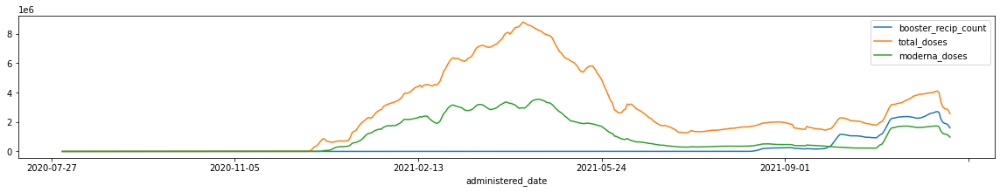

In [90]:
test.groupby('administered_date').sum().rolling(7).sum().plot(y=['booster_recip_count','total_doses','moderna_doses'])

In [104]:
vaccines = test.groupby('administered_date').sum().reset_index()

In [105]:
vaccines = vaccines[['administered_date','total_doses','pfizer_doses','moderna_doses','jj_doses',\
                     'booster_recip_count']]\
.rename(columns={'administered_date':'Date','total_doses':'Total Doses','moderna_doses':'Moderna Doses',\
                'pfizer_doses':'Pfizer Doses','jj_doses':'Johnson & Johnson Doses','booster_recip_count':'Booster Doses'})

In [113]:
vaccines['Date'] = pd.to_datetime(vaccines['Date'])

In [117]:
vaccines.to_csv("cleaned_vaccinations.csv")

In [416]:
vaccines

,Date,Total Doses,Pfizer Doses,Moderna Doses,Johnson & Johnson Doses,Booster Doses
0,2020-07-27,9,6,3,0,0
1,2020-07-28,12,3,9,0,0
2,2020-07-29,21,0,21,0,0
3,2020-07-30,33,12,21,0,0
4,2020-07-31,18,12,6,0,0
...,...,...,...,...,...,...
486,2021-11-26,435861,205452,168497,8656,281541
487,2021-11-27,323665,135510,118245,6098,193293
488,2021-11-28,182729,75837,68125,3112,104946
489,2021-11-29,578577,251672,211778,14116,349098


In [179]:
cases['Cases'] = cases.groupby(['state'])['cases'].diff()

<AxesSubplot:xlabel='date'>

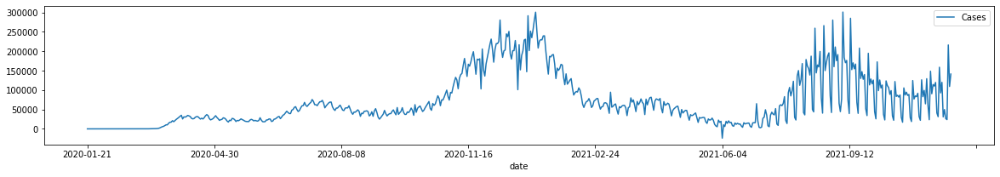

In [180]:
cases.groupby('date').sum().plot(y='Cases')

<AxesSubplot:xlabel='date'>

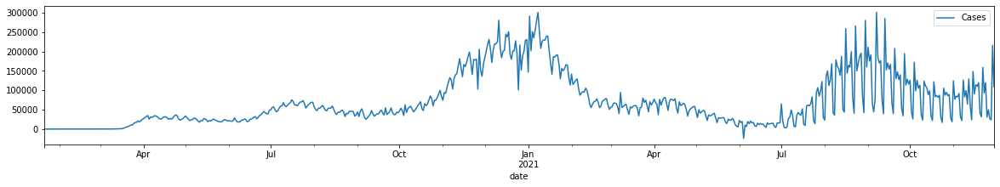

In [388]:
cases.groupby('date').sum().plot(y='Cases')

In [133]:
vaccines.rolling(7).sum()

,Total Doses,Pfizer Doses,Moderna Doses,Johnson & Johnson Doses,Booster Doses
0,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...
486,3047369.0,1362675.0,1234267.0,71900.0,1993488.0
487,2921264.0,1309705.0,1180977.0,67496.0,1911315.0
488,2893638.0,1290789.0,1161465.0,66690.0,1880259.0
489,2808896.0,1247714.0,1093714.0,64915.0,1785480.0


In [135]:
import plotly.express as px

In [154]:
px.line(vaccines, x="Date", y=["Total Doses"], markers = True)

In [417]:
vaccines_filtered = vaccines.rolling(7).sum()

In [418]:
vaccines_filtered['Date'] = vaccines['Date']

In [419]:
vaccines_filtered = vaccines_filtered.query('Date >="2020-11-01"')

In [420]:
vaccines_filtered.to_csv("cleaned/final_transformations/cleaned_vaccinations.csv")

In [181]:
cases['month'] = pd.to_datetime(cases['date']).dt.month

In [421]:
vaccines_filtered

,Total Doses,Pfizer Doses,Moderna Doses,Johnson & Johnson Doses,Booster Doses,Date
96,311.0,161.0,99.0,51.0,0.0,2020-11-01
97,332.0,161.0,111.0,60.0,0.0,2020-11-02
98,324.0,144.0,111.0,69.0,0.0,2020-11-03
99,368.0,174.0,90.0,104.0,0.0,2020-11-04
100,515.0,264.0,132.0,119.0,0.0,2020-11-05
...,...,...,...,...,...,...
486,3047369.0,1362675.0,1234267.0,71900.0,1993488.0,2021-11-26
487,2921264.0,1309705.0,1180977.0,67496.0,1911315.0,2021-11-27
488,2893638.0,1290789.0,1161465.0,66690.0,1880259.0,2021-11-28
489,2808896.0,1247714.0,1093714.0,64915.0,1785480.0,2021-11-29


In [197]:
cases['state']=(cases['state']).map(us_state_to_abbrev)

In [198]:
data_path="mapbox_token/"
with urlopen('https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json') as response:
    states = json.load(response)
    
cases['state'] = cases['state'].astype('str')
cases['fips'] = cases['fips'].astype('str')
df2020=cases
plot_df=cases
plot_var="cases"
#days = np.sort(plot_df.date.unique())
#months = ["Jan 2020","Feb 2020","Mar 2020","Apr 2020","May 2020","Jun 2020","Jul 2020","Aug 2020","Sep 2020","Oct 2020","Nov 2020","Dec 2020", "Jan 2021","Feb 2021","Mar 2021","Apr 2021","May 2021","Jun 2021","Jul 2021","Aug 2021","Sep 2021","Oct 2021"]
months = [1,2,3,4,5,6,7,8,9,10,11,12]
def numpy_dt64_to_str(dt64):
    day_timestamp_dt = (dt64 - np.datetime64('1970-01-01T00:00:00Z')) / np.timedelta64(1, 's')
    day_dt = dt.datetime.utcfromtimestamp(day_timestamp_dt)
    return day_dt.strftime("%b %d")

fig_data =go.Choroplethmapbox(geojson=states, locations=plot_df.fips, 
                              z=np.log10(plot_df[plot_var]),
                              zmin=0,
                              zmax=np.log10(plot_df[plot_var].max()),
                              customdata=plot_df[plot_var],
                              name="",
                              text=plot_df.state.astype(str),
                              hovertemplate="%{text}<br>Cases: %{customdata}",
                              colorbar=dict(outlinewidth=1,
                                            outlinecolor="#333333",
                                            len=0.9,
                                            lenmode="fraction",
                                            xpad=30,
                                            xanchor="right",
                                            bgcolor=None,
                                            title=dict(text="Cases",
                                                       font=dict(size=14)),
                                            tickvals=[0,1,2,3,4,5,6],
                                            ticktext=["1", "10", "100", "1K", "10K", "100K", "1M"],
                                            tickcolor="#333333",
                                            tickwidth=2,
                                            tickfont=dict(color="#333333",
                                                          size=12)),
                              colorscale="ylorrd", #ylgn
                              #reversescale=True,
                              marker_opacity=0.7,
                              marker_line_width=0)

token = open(data_path + ".mapbox_token").read()
fig_layout = go.Layout(mapbox_style="light",
                       mapbox_zoom=3,
                       mapbox_accesstoken=token,
                       mapbox_center={"lat": 37.0902, "lon": -95.7129},
                       margin={"r":0,"t":0,"l":0,"b":0},
                       plot_bgcolor=None)

fig_layout["updatemenus"] = [dict(type="buttons",
                                  buttons=[dict(label="Play",
                                                method="animate",
                                                args=[None,
                                                      dict(frame=dict(duration=1000,
                                                                      redraw=True),
                                                           fromcurrent=True)]),
                                           dict(label="Pause",
                                                method="animate",
                                                args=[[None],
                                                      dict(frame=dict(duration=0,
                                                                      redraw=True),
                                                           mode="immediate")])],
                                  direction="left",
                                  pad={"r": 10, "t": 35},
                                  showactive=False,
                                  x=0.1,
                                  xanchor="right",
                                  y=0,
                                  yanchor="top")]

sliders_dict = dict(active=len(months) - 1,
                    visible=True,
                    yanchor="top",
                    xanchor="left",
                    currentvalue=dict(font=dict(size=20),
                                      prefix="Month: ",
                                      visible=True,
                                      xanchor="right"),
                    pad=dict(b=10,
                             t=10),
                    len=0.875,
                    x=0.125,
                    y=0,
                    steps=[])

fig_frames = []
for month in months:
    plot_df = df2020[df2020.month == month]
    frame = go.Frame(data=[go.Choroplethmapbox(locations=plot_df.fips,
                                               z=np.log10(plot_df[plot_var]),
                                               customdata=plot_df[plot_var],
                                               name="",
                                               text=plot_df.state.astype(str),
                                               hovertemplate="%{text}<br>%{customdata}")],
                     name=month)
    fig_frames.append(frame)

    slider_step = dict(args=[[month],
                             dict(mode="immediate",
                                  frame=dict(duration=300,
                                             redraw=True))],
                       method="animate",
                       label=month)
    sliders_dict["steps"].append(slider_step)

fig_layout.update(sliders=[sliders_dict])

# Plot the figure 
fig=go.Figure(data=fig_data, layout=fig_layout, frames=fig_frames)

# fig=go.Figure(data=fig_data, layout=fig_layout, frames=fig_frames)
fig.show()

In [166]:
df2020

,date,state,fips,cases,deaths,Cases,month
0,2020-01-21,Washington,53,1,0,NaN,1
1,2020-01-22,Washington,53,1,0,0.0,1
2,2020-01-23,Washington,53,1,0,0.0,1
3,2020-01-24,Illinois,17,1,0,NaN,1
4,2020-01-24,Washington,53,1,0,0.0,1
...,...,...,...,...,...,...,...
35169,2021-11-30,Virginia,51,969116,14710,1907.0,11
35170,2021-11-30,Washington,53,777001,9349,1388.0,11
35171,2021-11-30,West Virginia,54,294794,4868,780.0,11
35172,2021-11-30,Wisconsin,55,980861,10006,5865.0,11


In [189]:
plot_df[plot_var]

32          0.0
33          0.0
34          0.0
35          NaN
36          0.0
          ...  
19974    1736.0
19975      70.0
19976     275.0
19977     481.0
19978      44.0
Name: Cases, Length: 1748, dtype: float64

In [276]:
cases = pd.read_csv("cleaned/final_transformations/cleaned_cases.csv")

In [328]:
mobility = pd.read_csv("cleaned/final_transformations/apple_mobility_states.csv")

In [295]:
mental_health = pd.read_csv("cleaned/final_transformations/df_mental_national_clean.csv")

In [288]:
vaccinations = pd.read_csv("cleaned/final_transformations/cleaned_vaccinations.csv")

In [332]:
mobility.set_index('month_year',inplace=True)

In [333]:
mobility

,Alabama,Arizona,California,Colorado,Connecticut,Delaware,Florida,Georgia,Hawaii,Illinois,...,Oklahoma,Oregon,Pennsylvania,Rhode Island,Tennessee,Texas,Utah,Virginia,Washington,Wisconsin
month_year,,,,,,,,,,,,,,,,,,,,,
Jan 2020,111.386842,100.345658,100.081645,97.707368,105.399561,88.402632,92.973125,92.418421,95.592807,102.175132,...,97.643947,100.485351,92.506579,107.488684,94.382500,104.340105,97.337544,92.941184,93.458772,139.557368
Feb 2020,113.788621,100.913017,102.559759,97.350172,108.422011,95.836207,96.125216,94.161379,91.992069,105.080172,...,102.092414,103.881092,92.667552,110.401207,98.990776,106.530184,95.124023,94.516595,92.951149,145.417155
Mar 2020,88.307419,73.203468,60.720032,65.567782,69.134462,67.979677,66.902823,68.550591,53.865699,66.781613,...,83.703710,61.656667,57.189452,67.945645,77.675484,76.706172,59.265376,62.755202,53.023047,79.672097
Apr 2020,61.868000,42.959250,28.185500,34.636000,33.566056,28.557333,33.556625,43.631889,14.089111,33.594000,...,62.958833,22.627611,28.570667,25.671833,48.029167,43.090067,29.271556,33.582708,25.076407,34.260417
May 2020,83.730690,51.458065,35.070627,46.735968,44.689301,34.264194,45.532894,51.290441,19.614624,42.931774,...,86.445000,26.964758,34.733940,35.493065,59.762500,56.699541,39.272742,41.044919,30.327491,40.689839
Jun 2020,101.915000,58.900833,46.157025,61.263958,67.929611,55.730667,57.183979,62.482500,27.215778,60.336500,...,100.287667,38.190722,47.861567,54.525833,72.560167,67.291422,50.231778,55.582958,41.776556,50.671750
Jul 2020,100.729677,54.271210,47.535403,64.864395,78.795215,63.273871,56.833589,64.183602,25.501613,65.191935,...,99.029677,42.591452,53.729935,63.649516,73.350161,63.481247,53.097849,58.638226,43.480251,52.912742
Aug 2020,100.843871,59.965403,47.576919,69.567984,84.484731,64.238065,58.590282,64.988656,23.136129,62.923065,...,100.482903,46.537634,59.229581,62.794516,71.889677,67.111656,65.977957,59.852500,45.387061,64.360484
Sep 2020,104.457000,68.303333,49.105758,68.247292,89.701944,65.251667,59.787271,63.651333,24.340444,61.968000,...,98.632333,46.634389,61.607800,68.768500,73.864083,68.964511,72.558556,63.512625,46.446630,76.469417


In [334]:
cases['date'] = pd.to_datetime(cases['date'])
cases['year'] = cases['date'].dt.year
cases["month"] = cases["date"].dt.month
cases['day'] = cases['date'].dt.day

vaccinations['date'] = pd.to_datetime(vaccinations['Date'])
vaccinations['year'] = vaccinations['date'].dt.year
vaccinations["month"] = vaccinations["date"].dt.month
vaccinations['day'] = vaccinations['date'].dt.day

In [336]:
mobility

,Alabama,Arizona,California,Colorado,Connecticut,Delaware,Florida,Georgia,Hawaii,Illinois,...,Oklahoma,Oregon,Pennsylvania,Rhode Island,Tennessee,Texas,Utah,Virginia,Washington,Wisconsin
month_year,,,,,,,,,,,,,,,,,,,,,
Jan 2020,111.386842,100.345658,100.081645,97.707368,105.399561,88.402632,92.973125,92.418421,95.592807,102.175132,...,97.643947,100.485351,92.506579,107.488684,94.382500,104.340105,97.337544,92.941184,93.458772,139.557368
Feb 2020,113.788621,100.913017,102.559759,97.350172,108.422011,95.836207,96.125216,94.161379,91.992069,105.080172,...,102.092414,103.881092,92.667552,110.401207,98.990776,106.530184,95.124023,94.516595,92.951149,145.417155
Mar 2020,88.307419,73.203468,60.720032,65.567782,69.134462,67.979677,66.902823,68.550591,53.865699,66.781613,...,83.703710,61.656667,57.189452,67.945645,77.675484,76.706172,59.265376,62.755202,53.023047,79.672097
Apr 2020,61.868000,42.959250,28.185500,34.636000,33.566056,28.557333,33.556625,43.631889,14.089111,33.594000,...,62.958833,22.627611,28.570667,25.671833,48.029167,43.090067,29.271556,33.582708,25.076407,34.260417
May 2020,83.730690,51.458065,35.070627,46.735968,44.689301,34.264194,45.532894,51.290441,19.614624,42.931774,...,86.445000,26.964758,34.733940,35.493065,59.762500,56.699541,39.272742,41.044919,30.327491,40.689839
Jun 2020,101.915000,58.900833,46.157025,61.263958,67.929611,55.730667,57.183979,62.482500,27.215778,60.336500,...,100.287667,38.190722,47.861567,54.525833,72.560167,67.291422,50.231778,55.582958,41.776556,50.671750
Jul 2020,100.729677,54.271210,47.535403,64.864395,78.795215,63.273871,56.833589,64.183602,25.501613,65.191935,...,99.029677,42.591452,53.729935,63.649516,73.350161,63.481247,53.097849,58.638226,43.480251,52.912742
Aug 2020,100.843871,59.965403,47.576919,69.567984,84.484731,64.238065,58.590282,64.988656,23.136129,62.923065,...,100.482903,46.537634,59.229581,62.794516,71.889677,67.111656,65.977957,59.852500,45.387061,64.360484
Sep 2020,104.457000,68.303333,49.105758,68.247292,89.701944,65.251667,59.787271,63.651333,24.340444,61.968000,...,98.632333,46.634389,61.607800,68.768500,73.864083,68.964511,72.558556,63.512625,46.446630,76.469417


In [342]:
cases_state = cases_groups.pivot_table(index='month_year',columns='state',values='cases').reset_index()

In [338]:
cases_groups = cases.groupby(["year","month",'state']).sum().reset_index()
cases_groups['month_year'] = cases_groups['month'].apply(lambda x: calendar.month_abbr[x]).astype(str) +" " + cases_groups['year'].astype(str)

In [292]:
vaccinations_groups = vaccinations.groupby(["year","month"]).sum().reset_index()
vaccinations_groups['month_year'] = vaccinations_groups['month'].apply(lambda x: calendar.month_abbr[x]).astype(str) +" " + vaccinations_groups['year'].astype(str)

In [293]:
vaccinations_groups

,year,month,Unnamed: 0,Total Doses,Pfizer Doses,Moderna Doses,Johnson & Johnson Doses,Booster Doses,day,month_year
0,2020,12,2516,8817130.0,7535104.0,1276533.0,3077.0,0.0,391,Dec 2020
1,2021,1,5332,63928177.0,31284717.0,32621711.0,5714.0,0.0,496,Jan 2021
2,2021,2,5642,121941241.0,60597940.0,61287836.0,11992.0,0.0,406,Feb 2021
3,2021,3,7161,209793841.0,107784072.0,93157993.0,8785040.0,0.0,496,Mar 2021
4,2021,4,7845,245184400.0,132988248.0,97035627.0,15101747.0,0.0,465,Apr 2021
5,2021,5,9052,166571683.0,103112135.0,58434490.0,4985397.0,0.0,496,May 2021
6,2021,6,9675,73676438.0,51053013.0,18927754.0,3669140.0,0.0,465,Jun 2021
7,2021,7,10943,43448081.0,31456113.0,9899585.0,2074219.0,0.0,496,Jul 2021
8,2021,8,11904,55543394.0,40370477.0,13064184.0,2092199.0,3118182.0,496,Aug 2021
9,2021,9,12435,49686203.0,36667000.0,11603913.0,1400891.0,8570949.0,465,Sep 2021


In [298]:
result = pd.merge(vaccinations_groups, cases_groups, how="inner", on='month_year')

In [301]:
result1 = pd.merge(result, mobility, on='month_year')

In [304]:
result1 = result1[['month_year','Total Doses','Cases','transit','deaths']]

In [324]:
result1.corr()

,Total Doses,Cases,transit,deaths
Total Doses,1.000000,-0.519890,-0.245376,0.088081
Cases,-0.519890,1.000000,-0.291647,-0.519397
transit,-0.245376,-0.291647,1.000000,0.919570
deaths,0.088081,-0.519397,0.919570,1.000000


In [318]:
new = result1[['Cases']].apply(lambda x: x * 1.0 / np.max(x), axis=0)

In [319]:
new['vaccines'] = result1[['Total Doses']].apply(lambda x: x * 1.0 / np.max(x), axis=0)['Total Doses']

In [320]:
new['transit'] = result1[['transit']].apply(lambda x: x * 1.0 / np.max(x), axis=0)['transit']

In [321]:
new['deaths'] = result1[['deaths']].apply(lambda x: x * 1.0 / np.max(x), axis=0)['deaths']

<AxesSubplot:>

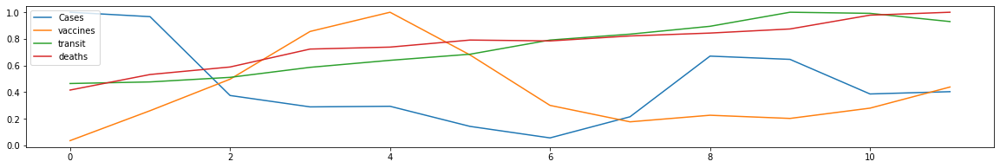

In [325]:
new.plot()

In [326]:
cases

,Unnamed: 0,date,state,fips,cases,deaths,Cases,year,month,day,State
0,0,2020-01-21,Washington,53,1,0,NaN,2020,1,21,WA
1,1,2020-01-22,Washington,53,1,0,0.0,2020,1,22,WA
2,2,2020-01-23,Washington,53,1,0,0.0,2020,1,23,WA
3,3,2020-01-24,Illinois,17,1,0,NaN,2020,1,24,IL
4,4,2020-01-24,Washington,53,1,0,0.0,2020,1,24,WA
...,...,...,...,...,...,...,...,...,...,...,...
35169,35169,2021-11-30,Virginia,51,969116,14710,1907.0,2021,11,30,VA
35170,35170,2021-11-30,Washington,53,777001,9349,1388.0,2021,11,30,WA
35171,35171,2021-11-30,West Virginia,54,294794,4868,780.0,2021,11,30,WV
35172,35172,2021-11-30,Wisconsin,55,980861,10006,5865.0,2021,11,30,WI


In [327]:
vaccinations

,Unnamed: 0,Total Doses,Pfizer Doses,Moderna Doses,Johnson & Johnson Doses,Booster Doses,Date,date,year,month,day
0,140,5497.0,4722.0,379.0,381.0,0.0,2020-12-15,2020-12-15,2020,12,15
1,141,34183.0,33298.0,442.0,410.0,0.0,2020-12-16,2020-12-16,2020,12,16
2,142,121553.0,120525.0,519.0,428.0,0.0,2020-12-17,2020-12-17,2020,12,17
3,143,268091.0,266921.0,734.0,335.0,0.0,2020-12-18,2020-12-18,2020,12,18
4,144,348602.0,347388.0,786.0,323.0,0.0,2020-12-19,2020-12-19,2020,12,19
...,...,...,...,...,...,...,...,...,...,...,...
346,486,3047369.0,1362675.0,1234267.0,71900.0,1993488.0,2021-11-26,2021-11-26,2021,11,26
347,487,2921264.0,1309705.0,1180977.0,67496.0,1911315.0,2021-11-27,2021-11-27,2021,11,27
348,488,2893638.0,1290789.0,1161465.0,66690.0,1880259.0,2021-11-28,2021-11-28,2021,11,28
349,489,2808896.0,1247714.0,1093714.0,64915.0,1785480.0,2021-11-29,2021-11-29,2021,11,29


In [343]:
cases_state

state,month_year,Alabama,Alaska,American Samoa,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,...,Tennessee,Texas,Utah,Vermont,Virgin Islands,Virginia,Washington,West Virginia,Wisconsin,Wyoming
0,Apr 2020,125166.0,8231.0,NaN,128668.0,53571.0,865585.0,264026.0,467204.0,67480.0,...,187332.0,494349.0,82277.0,21158.0,1530.0,223907.0,327552.0,21315.0,119648.0,10987.0
1,Apr 2021,15647349.0,1955478.0,NaN,25567954.0,9990989.0,111307756.0,14666476.0,9809247.0,3000969.0,...,24465405.0,85205219.0,11754057.0,645633.0,90347.0,19242450.0,11560038.0,4432742.0,19474884.0,1716152.0
2,Aug 2020,3355858.0,154871.0,NaN,5951480.0,1633930.0,19168704.0,1642292.0,1585462.0,503506.0,...,4014961.0,17220155.0,1445189.0,46881.0,23904.0,3291471.0,2150641.0,262522.0,2165905.0,102356.0
3,Aug 2021,19824481.0,2503376.0,NaN,30036830.0,13065966.0,131516991.0,18506769.0,11268515.0,3567960.0,...,29258076.0,104271222.0,13877144.0,817433.0,163513.0,22501366.0,16036798.0,5441407.0,21977820.0,2152271.0
4,Dec 2020,9513716.0,1278752.0,NaN,13328487.0,5960217.0,53961030.0,9135593.0,4793649.0,1466659.0,...,14564881.0,47212101.0,7429166.0,185248.0,56480.0,9076350.0,6674793.0,2081323.0,14724521.0,1239260.0
5,Feb 2020,NaN,NaN,NaN,29.0,NaN,285.0,NaN,NaN,NaN,...,NaN,91.0,5.0,NaN,NaN,NaN,60.0,NaN,25.0,NaN
6,Feb 2021,13436108.0,1572767.0,NaN,22273592.0,8718837.0,97356780.0,11643413.0,7518722.0,2317309.0,...,20758262.0,71461628.0,10101969.0,383757.0,70864.0,15308866.0,9283692.0,3563232.0,16987567.0,1491294.0
7,Jan 2020,NaN,NaN,NaN,6.0,NaN,14.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,11.0,NaN,NaN,NaN
8,Jan 2021,12918813.0,1582034.0,NaN,20456595.0,8247175.0,90326882.0,11537516.0,6900960.0,2135494.0,...,20428259.0,64851664.0,9842546.0,303812.0,68376.0,13357007.0,8942940.0,3300070.0,17417378.0,1509286.0
9,Jul 2020,1918336.0,67633.0,NaN,4105142.0,972426.0,11404982.0,1215655.0,1483675.0,410198.0,...,2204796.0,9496585.0,988673.0,41004.0,7748.0,2330822.0,1439072.0,145677.0,1357567.0,63980.0


In [346]:
corr = pd.merge(mobility.reset_index(), cases_state, on='month_year')

In [386]:
corr[['Pennsylvania_y','Pennsylvania_x']].corr()

,Pennsylvania_y,Pennsylvania_x
Pennsylvania_y,1.000000,0.785304
Pennsylvania_x,0.785304,1.000000


In [362]:
import plotly.express as px
import pandas as pd
df = pd.read_csv('cleaned/final_transformations/cleaned_cases.csv')
df['state_code']=(df['state']).map(us_state_to_abbrev)
df['month']=pd.to_datetime(df["date"]).dt.month
df['week']=pd.to_datetime(df["date"]).dt.week 



df['year']=pd.to_datetime(df["date"]).dt.year
df['month_year'] = df['month'].apply(lambda x: calendar.month_abbr[x]).astype(str) +" " + df['year'].astype(str)

<ipython-input-362-fe122ae75ae7>:6: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



In [363]:
df = df[(df['state']!= 'District of Columbia' )]
fig=px.choropleth(df, 
              locations = 'state_code',
              color="cases", 
              animation_frame="month_year",
              color_continuous_scale="blues",
              locationmode='USA-states',
              scope="usa",
              range_color=(200, 1000000),
              title='Number of cases by state',
              height=600,
             )
fig.add_scattergeo(name='State Names',
    locations=df['state_code'],
    locationmode='USA-states',
    text=df['state_code'],
    mode='text')
fig.show()

In [375]:
power = pd.read_csv("/Users/Vineeth/Downloads/2021.csv", thousands=",")

In [376]:
power['month_year'] = power['MONTH'].apply(lambda x: calendar.month_abbr[x]).astype(str) +" " + power['YEAR'].astype(str)

In [377]:
power

,YEAR,MONTH,STATE,TYPE OF PRODUCER,ENERGY SOURCE,GENERATION\n(Megawatthours),month_year
0,2021,1,AK,Total Electric Power Industry,Total,516998,Jan 2021
1,2021,1,AK,Total Electric Power Industry,Coal,76803,Jan 2021
2,2021,1,AK,Total Electric Power Industry,Hydroelectric Conventional,183535,Jan 2021
3,2021,1,AK,Total Electric Power Industry,Natural Gas,183908,Jan 2021
4,2021,1,AK,Total Electric Power Industry,Other,-256,Jan 2021
...,...,...,...,...,...,...,...
19059,2021,9,WY,"Electric Generators, Electric Utilities",Coal,3012500,Sep 2021
19060,2021,9,WY,"Electric Generators, Electric Utilities",Hydroelectric Conventional,55439,Sep 2021
19061,2021,9,WY,"Electric Generators, Electric Utilities",Natural Gas,97182,Sep 2021
19062,2021,9,WY,"Electric Generators, Electric Utilities",Petroleum,4646,Sep 2021


In [378]:
power.groupby('month_year').sum()

,YEAR,MONTH,GENERATION\n(Megawatthours)
month_year,,,
Apr 2021,4282499,8476,2339753267
Aug 2021,4282499,16952,3311594402
Feb 2021,4282499,4238,2622594174
Jan 2021,4282499,2119,2805638287
Jul 2021,4282499,14833,3237300922
Jun 2021,4280478,12708,2989366898
Mar 2021,4282499,6357,2497213427
May 2021,4276436,10580,2550646945
Sep 2021,4276436,19044,2784616324


In [380]:
final = pd.merge(result1, power.groupby('month_year').sum().reset_index(), on="month_year")

In [382]:
final.corr()

,Total Doses,Cases,transit,deaths,YEAR,MONTH,GENERATION\n(Megawatthours)
Total Doses,1.000000,-0.399214,-0.498650,-0.175127,0.099526,-0.458372,-0.851052
Cases,-0.399214,1.000000,-0.069927,-0.347668,0.136683,-0.120957,0.182274
transit,-0.498650,-0.069927,1.000000,0.918531,-0.458518,0.994760,0.569328
deaths,-0.175127,-0.347668,0.918531,1.000000,-0.476313,0.941219,0.372197
YEAR,0.099526,0.136683,-0.458518,-0.476313,1.000000,-0.454677,0.160792
MONTH,-0.458372,-0.120957,0.994760,0.941219,-0.454677,1.000000,0.564807
GENERATION\n(Megawatthours),-0.851052,0.182274,0.569328,0.372197,0.160792,0.564807,1.000000


In [383]:
final

,month_year,Total Doses,Cases,transit,deaths,YEAR,MONTH,GENERATION\n(Megawatthours)
0,Jan 2021,63928177.0,6196629.0,50.027357,12216246,4282499,2119,2805638287
1,Feb 2021,121941241.0,2402731.0,53.628027,13511297,4282499,4238,2622594174
2,Mar 2021,209793841.0,1854725.0,61.521473,16598892,4282499,6357,2497213427
3,Apr 2021,245184400.0,1883488.0,67.050523,16938705,4282499,8476,2339753267
4,May 2021,166571683.0,915538.0,71.858488,18153711,4276436,10580,2550646945
5,Jun 2021,73676438.0,361852.0,83.031874,18001372,4280478,12708,2989366898
6,Jul 2021,43448081.0,1378800.0,87.670024,18857527,4282499,14833,3237300922
7,Aug 2021,55543394.0,4298065.0,93.859600,19355736,4282499,16952,3311594402
8,Sep 2021,49686203.0,4141402.0,104.936020,20062799,4276436,19044,2784616324


In [398]:
cases = pd.read_csv("cleaned/final_transformations/cleaned_cases.csv")

In [399]:
cases['date'] = pd.to_datetime(cases['date'])
cases['year'] = cases['date'].dt.year
cases["month"] = cases["date"].dt.month
cases['day'] = cases['date'].dt.day
cases_groups = cases.groupby(["month",'year']).sum().reset_index().sort_values(by=['year','month'])
cases_groups['month_year'] = cases_groups['month'].apply(lambda x: calendar.month_abbr[x]).astype(str) +" " + cases_groups['year'].astype(str)

<AxesSubplot:xlabel='month_year'>

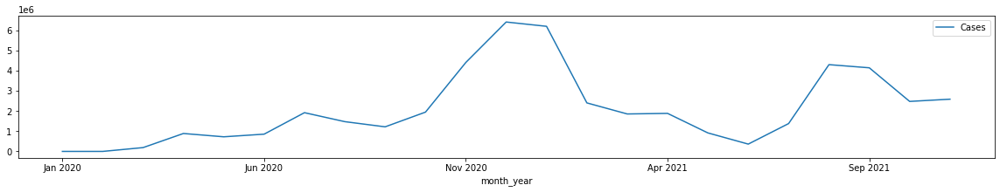

In [403]:
cases_groups.plot(x='month_year',y='Cases')

In [406]:
cases_groups[['month_year','Cases']].to_csv("cleaned/final_transformations/cleaned_case_groups.csv")

In [415]:
cases['time'] = cases.date.str.split('-')[1:]

AttributeError: Can only use .str accessor with string values!

In [411]:
cases

,Unnamed: 0,date,state,fips,cases,deaths,Cases,year,month,day,time
0,0,2020-01-21,Washington,53,1,0,NaN,2020,1,21,2020-01-21
1,1,2020-01-22,Washington,53,1,0,0.0,2020,1,22,2020-01-22
2,2,2020-01-23,Washington,53,1,0,0.0,2020,1,23,2020-01-23
3,3,2020-01-24,Illinois,17,1,0,NaN,2020,1,24,2020-01-24
4,4,2020-01-24,Washington,53,1,0,0.0,2020,1,24,2020-01-24
...,...,...,...,...,...,...,...,...,...,...,...
35169,35169,2021-11-30,Virginia,51,969116,14710,1907.0,2021,11,30,2021-11-30
35170,35170,2021-11-30,Washington,53,777001,9349,1388.0,2021,11,30,2021-11-30
35171,35171,2021-11-30,West Virginia,54,294794,4868,780.0,2021,11,30,2021-11-30
35172,35172,2021-11-30,Wisconsin,55,980861,10006,5865.0,2021,11,30,2021-11-30
